# Environment set up

In this section we will set up a Colab environment for the MLEnd mini-project. Before starting, follow these simple instructions:

1.   Go to https://drive.google.com/
2.   Create a folder named 'Data' in 'MyDrive': On the left, click 'New' > 'Folder', enter the name 'Data', and click 'create'
3.   Open the 'Data' folder and create a folder named 'MLEndDeception'.

Let's start by loading a few useful Python libraries and mounting our personal Google Drive storage system (i.e. making it available, so that Colab can access it).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data download

In this section we will download a small subsample of the MLEnd Deception Dataset.

You should be able to download the entire training dataset when it is made available. Please note that even though we call it "training" dataset you can do whatever you want with it (for instance validate a set of models). We have kept a separate private dataset for testing purposes, which we won't share with anyone.



Use the following link to download download the file 'MLEndDeception_Sample.zip':

https://drive.google.com/file/d/1Yf-A07B8R84QfBmKrBi__8HWiVcpzZGU/view?usp=sharing

Note that this might take a while! Then go ahead and upload the file 'MLEndDeception_Sample.zip' into the folder 'MyDrive/Data/MLEndDeception'.

Run the following cell to check that the MLEndLS folder contains the file 'MLEndDeception_Sample.zip':

In [ ]:
path = '/content/drive/MyDrive/Data/MLEndDeception'
os.listdir(path)

['MLEndDeception_small.csv',
 'MLEndDeception_small_sample.zip',
 'MLEndDeception_small_sample',
 'MLEnd_2024_Starter_kit.ipynb']

# Understanding our dataset sample

Let's unzip the small dataset:

In [ ]:
directory_to_extract_to = '/content/drive/MyDrive/Data/MLEndDeception/'
zip_path = '/content/drive/MyDrive/Data/MLEndDeception/MLEndDeception_small_sample.zip'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)



And now check how many audio files we have:

In [ ]:
sample_path = '/content/drive/MyDrive/Data/MLEndDeception/MLEndDeception_small_sample/*.wav'
files = glob.glob(sample_path)
len(files)

100

This figure (100) corresponds to the number of **items** or **samples** in our dataset. Let's listen to some random audio files:

In [ ]:
for _ in range(5):
  n = np.random.randint(100)
  display(ipd.Audio(files[n]))

Note that the audio samples are 20 seconds long. Can you recognise the language? What can you say about the acoustic environment? And finally: Can you tell whether the speaker is recounting a true story?

Now upload the CSV file 'MLEndDeception_small.csv'. Then run the next cell to load it into a Pandas DataFrame and print its contents.


In [ ]:
MLEND_df = pd.read_csv('/content/drive/MyDrive/Data/MLEndDeception/MLEndDeception_small.csv').set_index('file_id')
MLEND_df

,label
file_id,
00.wav,deceptive
01.wav,true
02.wav,deceptive
03.wav,true
04.wav,true
...,...
95.wav,deceptive
96.wav,deceptive
97.wav,deceptive


The Small MLEnd Deception dataset consists of 100 samples consisting of two attributes: a complex audio attribute and a binary label (`true`/`deceptive`). The audio attribute cannot be directly inserted in a table-like structure, like a Pandas DataFrame. So instead, we have created the DataFrame `MLEND_df`, where the first column captures the names of the audio files, e.g. '23.wav', and the audio files are stored elsewhere, in our case in the '/content/drive/MyDrive/Data/MLEndDeception/MLEndDeception_small_sample/' folder.

The next cell prints the contents of the folder that stores our sample audio files. You can see that the names of the WAV files correspond to one of the `file_id` entries in the `MLEnd_df` DataFrame.

In [ ]:
for file in files:
  print(file.split('/')[-1])

02.wav
16.wav
17.wav
03.wav
15.wav
01.wav
29.wav
28.wav
00.wav
14.wav
38.wav
10.wav
04.wav
05.wav
11.wav
39.wav
07.wav
13.wav
12.wav
06.wav
61.wav
75.wav
49.wav
48.wav
74.wav
60.wav
76.wav
62.wav
89.wav
88.wav
63.wav
77.wav
73.wav
67.wav
98.wav
99.wav
66.wav
72.wav
58.wav
64.wav
70.wav
71.wav
65.wav
59.wav
40.wav
54.wav
68.wav
83.wav
97.wav
96.wav
82.wav
69.wav
55.wav
41.wav
57.wav
43.wav
94.wav
80.wav
81.wav
95.wav
42.wav
56.wav
52.wav
46.wav
91.wav
85.wav
84.wav
90.wav
47.wav
53.wav
79.wav
45.wav
51.wav
86.wav
92.wav
93.wav
87.wav
50.wav
44.wav
78.wav
23.wav
37.wav
36.wav
22.wav
34.wav
20.wav
08.wav
09.wav
21.wav
35.wav
19.wav
31.wav
25.wav
24.wav
30.wav
18.wav
26.wav
32.wav
33.wav
27.wav


# Feature extraction : Picth

Audio files are complex data types. Specifically they are **discrete signals** or **time series**, consisting of values on a 1D temporal grid. These values are known as *samples* themselves, which might be a bit confusing, as we have used this term to refer to the *items* in our dataset. The **sampling frequency** is the rate at which samples in an audio file are produced. For instance a sampling frequency of 5HZ indicates that 5 produce 5 samples per second, or 1 sample every 0.2 s.

Let's plot one of our audio signals:

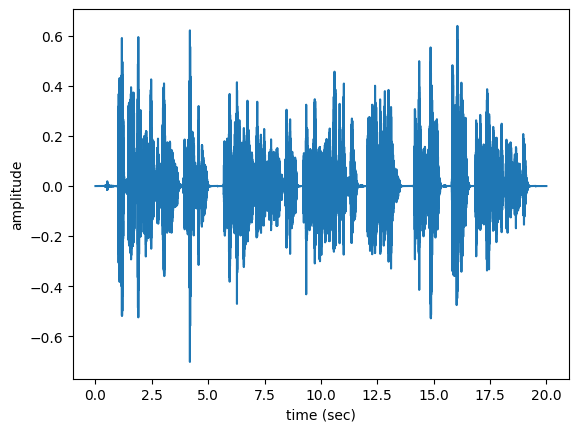

In [ ]:
n=2
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

Can you tell whether the speaker is recounting a true story? To find out which audio file we've listened to, run the following cell:


In [ ]:
files[2].split('/')[-1]

'17.wav'

Using the filename, we can extract its label from the `MLEnd_df` DataFrame as follows:

In [ ]:
MLEND_df.loc[files[n].split('/')[-1]]

,17.wav
label,deceptive


Note that we are using the name of the audio file as the index in the Pandas DataFrame. By changing the value of `n` in the previous cell, you can listen to other examples. If you are doing this during one of our lab sessions, please make sure that your mic is muted!

Exactly, how complex is an audio signal? Let's start by looking at the number of samples (i.e. audio samples) in one of our audio files:

In [ ]:
n=2
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'audio samples')

This audio signal has 882000 audio samples


If we are using a raw audio signal as the input of a machine learning model, we will be operating in a predictor space consisting of hundreds of thousands of dimensions. Compare this figure with the number of items (i.e. recordings) that we have. Do we have enough samples to train a model that takes one of these audio signals as an input?

One approach to deal with this huge dimensionality is to extract a few features from our signals and use these features as predictors instead. In this notebook we will use four audio features, namely:


1.   Power.
2.   Pitch - mean.
3.   Pitch - standard deviation.
4.   Fraction of voiced region.

In the next cell, we define a new function that gets the pitch of an audio signal (do not worry if you do not know what it is, but feel free to read about it!).

In [ ]:
int(881).bit_length()

10

In [ ]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

Let's consider the problem of determining whether an audio file records a true or a deceptive story . Then next cell defines a function that takes a collection of audio files together with a CSV file and creates a NumPy array containing the 4 audio features used as predictors (`X`) and a binary label (`y`) that indicates whether the recorded story is true (`y=1`) or deceptive (`y=0`).

In [ ]:
def getXy(files,labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]
    yi = labels_file.loc[fileID]['label']=='true'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    f0, voiced_flag = getPitch(x,fs,winLen=0.02)

    power = np.sum(x**2)/len(x)
    pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
    pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
    voiced_fr = np.mean(voiced_flag)

    xi = [power,pitch_mean,pitch_std,voiced_fr]
    X.append(xi)
    y.append(yi)

  return np.array(X),np.array(y)

Let's apply `getXy` to the Small MLEnd Deception dataset and obtain the NumPy predictor array (`X`) and a binary label (`y`). This could take a while, as we are processing each of the 100 audio signals.

In [ ]:
X,y = getXy(files, labels_file=MLEND_df, scale_audio=True, onlySingleDigit=True)

100%|██████████| 100/100 [05:36<00:00,  3.36s/it]


The next cell shows the shape of `X` and `y` and prints the labels vector `y`:

In [ ]:
print('The shape of X is', X.shape)
print('The shape of y is', y.shape)
print('The labels vector is', y)


The shape of X is (100, 4)
The shape of y is (100,)
The labels vector is [False  True False  True False  True  True  True False False  True  True
  True  True  True False False False False  True False  True  True  True
 False False  True  True  True False  True False  True False False False
 False  True False  True  True  True  True False  True  True False  True
 False False  True  True  True False False False  True  True  True False
 False  True False  True False False False  True False  True False  True
 False  True False  True False False  True  True  True False  True False
 False False  True  True  True False  True False False False  True False
 False False  True False]


As you can see, we have 100 items consisting of 4 features (stored in `X`) and one binary label (stored in `y`). Is our dataset balanced? Let's have a look:

In [ ]:
print(' The number of true stories is ', np.count_nonzero(y))
print(' The number of deceptive stories is ', y.size - np.count_nonzero(y))

 The number of true stories is  50
 The number of deceptive stories is  50


# Modeling: Support Vector Machines

Let's build a support vector machine (SVM) model for the predictive task of identifying the type of story (true/deceptive) using the dataset that we have just created.

We will use the SVM method provided by scikit-learn and will split the dataset defined by X and y into a training set and a validation set.

In [ ]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((70, 4), (30, 4), (70,), (30,))

Can you identify the number of items in the training and validation sets?

Let's now fit an SVM model and print both the training accuracty and validation accuracy.


In [ ]:
model  = svm.SVC(C=1)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.5714285714285714
Validation  Accuracy 0.3333333333333333
The support vectors are (65, 4)


Compare the training and validation accuracies. Is our model overfitting, underfitting, performing well? What do you think the accuracy of a random classifier would be?

Let's normalise the predictors, to see if the performance improves.


In [ ]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

model  = svm.SVC(C=1,gamma=2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.9285714285714286
Validation  Accuracy 0.43333333333333335
The support vectors are (68, 4)


Do you think we have obtained a better solution?

What machine learning pipeline have we implemented for each solution? Feel free to try other machine learning models available in scikit, it's very easy!

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

X_traink, X_valk, y_traink, y_valk = train_test_split(X,y,test_size=0.3)
X_traink.shape, X_valk.shape, y_traink.shape, y_valk.shape

modelk = KNeighborsClassifier(n_neighbors=2)
modelk.fit(X_traink,y_traink)

yt_pk = modelk.predict(X_traink)
yv_pk = modelk.predict(X_valk)

print('Training Accuracy', np.mean(yt_pk==y_traink))
print('Validation Accuracy', np.mean(yv_pk==y_valk))

Training Accuracy 0.7
Validation Accuracy 0.5


In [ ]:
meank = X_traink.mean(0)
sdk =  X_traink.std(0)

X_traink = (X_traink-meank)/sdk
X_valk  = (X_valk-meank)/sdk

modelk1 = KNeighborsClassifier(n_neighbors=2)
modelk1.fit(X_traink,y_traink)

yt_pk1 = modelk1.predict(X_traink)
yv_pk1 = modelk1.predict(X_valk)

print('Training Accuracy', np.mean(yt_pk1==y_traink))
print('Validation Accuracy', np.mean(yv_pk1==y_valk))

Training Accuracy 0.7571428571428571
Validation Accuracy 0.5


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

X_traindt, X_valdt, y_traindt, y_valdt = train_test_split(X,y,test_size=0.3)
X_traindt.shape, X_valdt.shape, y_traindt.shape, y_valdt.shape

modeldt = DecisionTreeClassifier()
modeldt.fit(X_traindt,y_traindt)

yt_pdt = modeldt.predict(X_traindt)
yv_pdt = modeldt.predict(X_valdt)

print('Training Accuracy', np.mean(yt_pdt==y_traindt))
print('Validating Accuracy', np.mean(yv_pdt==y_valdt))


Training Accuracy 1.0
Validating Accuracy 0.4


In [ ]:
meandt = X_traindt.mean(0)
sdt =  X_traindt.std(0)

X_traindt = (X_traindt-meandt)/sdt
X_valdt  = (X_valdt-meandt)/sdt

modeldt1 = DecisionTreeClassifier()
modeldt1.fit(X_traindt,y_traindt)

yt_pdt1 = modeldt1.predict(X_traindt)
yv_pdt1 = modeldt1.predict(X_valdt)

print('Training Accuracy', np.mean(yt_pdt1==y_traindt))
print('Validating Accuracy', np.mean(yv_pdt1==y_valdt))


Training Accuracy 1.0
Validating Accuracy 0.5


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X_trainrf, X_valrf, y_trainrf, y_valrf = train_test_split(X,y,test_size=0.3)

modelrf = RandomForestClassifier()
modelrf.fit(X_trainrf,y_trainrf)

yt_prf = modelrf.predict(X_trainrf)
yv_prf = modelrf.predict(X_valrf)

print('Training Accuracy', np.mean(yt_prf==y_trainrf))
print('Validating Accuracy', np.mean(yv_prf==y_valrf))


Training Accuracy 1.0
Validating Accuracy 0.43333333333333335


In [ ]:
meanrf = X_trainrf.mean(0)
srf = X_trainrf.std(0)

X_trainrf = (X_trainrf-meanrf)/srf
X_valrf = (X_valrf-meanrf)/srf

modelrf1 = RandomForestClassifier()
modelrf1.fit(X_trainrf, y_trainrf)

yt_prf1 = modelrf1.predict(X_trainrf)
yv_prf1 = modelrf1.predict(X_valrf)

print('Training Accuracy', np.mean(yt_prf1==y_trainrf))
print('Validating Accuracy', np.mean(yv_prf1==y_valrf))

Training Accuracy 1.0
Validating Accuracy 0.6


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

X_trainlr, X_vallr, y_trainlr, y_vallr = train_test_split(X,y,test_size=0.3)

modellr = LogisticRegression()
modellr.fit(X_trainlr, y_trainlr)

yp_tlr = modellr.predict(X_trainlr)
yv_lr = modellr.predict(X_vallr)

print('Training Accuracy', np.mean(yp_tlr==y_trainlr))
print('Validating Accuracy', np.mean(yv_lr==y_vallr))


Training Accuracy 0.6142857142857143
Validating Accuracy 0.3333333333333333


In [ ]:
from logging import logProcesses
meanlr = X_trainlr.mean(0)
slr = X_trainlr.std(0)

X_trainlr = (X_trainlr-meanlr)/slr
X_vallr = (X_vallr-meanlr)/slr

modellr1 = LogisticRegression()
modellr1.fit(X_trainlr, y_trainlr)

yp_tlr1 = modellr1.predict(X_trainlr)
yv_lr1 = modellr1.predict(X_vallr)

print('Training Accuracy', np.mean(yp_tlr1==y_trainlr))
print('Validating Accuracy', np.mean(yv_lr1==y_vallr))

Training Accuracy 0.5428571428571428
Validating Accuracy 0.36666666666666664
